In [1]:
%run ../ipynb_util_tars.py

In [2]:
%run ../ipynb_load_data_natural.py

{'SDG': Value(dtype='int64', id=None), 'ABSTRACT': Value(dtype='string', id=None), 'id': Value(dtype='string', id=None), 'sdg_desc_short': Value(dtype='string', id=None), 'sdg_desc_long': Value(dtype='string', id=None), '__index_level_0__': Value(dtype='int64', id=None)}
Example instance:	 {'SDG': 8, 'ABSTRACT': 'The scheme gives enterprises with business activity in Norway a tax credit on their R&D projects. The R&D content must be approved by the Research Council of Norway ex ante. In 2009, the cap on expenses per enterprise for intramural R&D projects increased to NOK 5.5 million (previously it was N0K 4 million), and NOK11 million (previously it was NOK 8 million) for projects conducted at an R&D institution.', 'id': None, 'sdg_desc_short': None, 'sdg_desc_long': None, '__index_level_0__': 492}
id2label: {0: '1', 1: '2', 2: '3', 3: '4', 4: '5', 5: '6', 6: '7', 7: '8', 8: '9', 9: '10', 10: '11', 11: '12', 12: '13', 13: '14', 14: '15', 15: '16', 16: '17'}
label2id: {'1': 0, '2': 1, '

In [3]:
import os
os.environ['SHAP_FORCE_NO_NUMBA'] = '1'

In [4]:
# load scibert
import transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# load the best model
MODEL_PATH = CHECKPOINT_PATH + "/final/allenai/scibert_scivocab_cased-zo_up/checkpoint-432/"

model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_PATH,
    id2label=id2label,
    label2id=label2id
)
tokenizer = AutoTokenizer.from_pretrained(MODEL_PATH, do_lower_case=False, skip_special_tokens=False)
model.eval()

pred = transformers.pipeline(
    "text-classification",
    model=model,
    batch_size=8,
    tokenizer=tokenizer,
    truncation=True,
    padding=True,
    max_length=512,
    device=0,
    top_k=None,     # equal to return_all_scores=True
)

In [5]:
sample_sentence = "Is this about clean energy?"
sample_sentence = "Tackling supply deficits within individual catchments will be a high cost approach, increasing the requirement for new infrastructure, and requiring more constraint on water use. However, water is heavy and pumping - and carbon - costs are high, so large scale, long distance transfers are expensive, relative to the water’s value. But there is scope for greater interconnection within and between water companies."

idx = 274
sample_sentence = dataset["train"][idx]["ABSTRACT"]
print(dataset["train"][idx]["SDG"] + 1)

#sample_sentence = "Ensure access to affordable, reliable, sustainable and modern energy for all"

#sample_sentence = "The role of development finance institutions in low‐income and emerging countries is fundamental to provide long‐term capital for investments in climate mitigation and adaptation. Nevertheless, development finance institutions still lack sound and transparent metrics to assess their projects' exposure to climate risks and their impact on global climate action. To attempt to fill this gap, we develop a novel climate stress‐test methodology for portfolios of loans to energy infrastructure projects. We apply the methodology to the portfolios of overseas energy projects of two main Chinese policy banks. We estimate their exposure to economic and financial shocks that would result in government inability to introduce timely 2°C‐aligned climate policies and from investors' inability to adapt their business to the changing climate and policy environment. We find that the negative shocks are mostly concentrated on coal and oil projects and vary across regions from 4.2 to 22 percent of the total loan value. Given the current leverage of Chinese policy banks, these losses could induce severe financial distress, with implications on macroeconomic and financial stability. "
#sample_sentence = "Deliberative inclusion of minorities: patterns of reciprocity among linguistic groups in Switzerland We present a model of deliberative inclusion, focusing on reciprocity in the interaction between structural minorities/disadvantaged groups and majorities/privileged groups. Our model, however, comes with a ‘friendly amendment’: we have put the ‘burden of reciprocity’ mainly on majorities and privileged groups. It is mainly their obligation to seriously listen and respond to the demands and arguments of minorities and disadvantaged groups and show a willingness to respect and accommodate these interests. Empirically, we apply our model to the interaction of linguistic groups in the Swiss parliament. We find a highly egalitarian, sometimes even minority-favoring mode of interaction between the German-speaking majority and linguistic minorities. The German-speaking majority seems to be willing to take the ‘burden of reciprocity’ when linguistic minorities’ vital interests are concerned. Conversely, linguistic minorities are slightly more self-referential and adversarial under such conditions."
#sample_sentence = "In 2006, 32 per cent of households with children under 16 and almost 50 per cent of unemployed mothers with children under 2 were receiving an allowance (UNICEF 2009b). Less than two per cent of families received social aid. Of all recipients of any social allowance, 95 per cent belong to the poorest 50 per cent of the population (Tahlil, 2009). For the poorest ten per cent, the different social allowances contribute between one fourth and one third to the total household income."
#sample_sentence = "Alteration of nitrous oxide emissions from floodplain soils by aggregate size, litter accumulation and plant–soil interactions Semi-terrestrial soils such as floodplain soils are considered potential hot spots of nitrous oxide (N2O) emissions. Microhabitats in the soil – such as within and outside of aggregates, in the detritusphere, and/or in the rhizosphere – are considered to promote and preserve specific redox conditions. Yet our understanding of the relative effects of such microhabitats and their interactions on N2O production and consumption in soils is still incomplete. Therefore, we assessed the effect of aggregate size, buried leaf litter, and plant–soil interactions on the occurrence of enhanced N2O emissions under simulated flooding/drying conditions in a mesocosm experiment. We used two model soils with equivalent structure and texture, comprising macroaggregates (4000–250 µm) or microaggregates (<250 µm) from a N-rich floodplain soil. These model soils were planted with basket willow (Salix viminalis L.), mixed with leaf litter or left unamended. After 48 h of flooding, a period of enhanced N2O emissions occurred in all treatments. The unamended model soils with macroaggregates emitted significantly more N2O during this period than those with microaggregates. Litter addition modulated the temporal pattern of the N2O emission, leading to short-term peaks of high N2O fluxes at the beginning of the period of enhanced N2O emission. The presence of S. viminalis strongly suppressed the N2O emission from the macroaggregate model soil, masking any aggregate-size effect. Integration of the flux data with data on soil bulk density, moisture, redox potential and soil solution composition suggest that macroaggregates provided more favourable conditions for spatially coupled nitrification–denitrification, which are particularly conducive to net N2O production. The local increase in organic carbon in the detritusphere appears to first stimulate N2O emissions; but ultimately, respiration of the surplus organic matter shifts the system towards redox conditions where N2O reduction to N2 dominates. Similarly, the low emission rates in the planted soils can be best explained by root exudation of low-molecular-weight organic substances supporting complete denitrification in the anoxic zones, but also by the inhibition of denitrification in the zone, where rhizosphere aeration takes place. Together, our experiments highlight the importance of microhabitat formation in regulating oxygen (O2) content and the completeness of denitrification in soils during drying after saturation. Moreover, they will help to better predict the conditions under which hot spots, and “hot moments”, of enhanced N2O emissions are most likely to occur in hydrologically dynamic soil systems like floodplain soils."
#sample_sentence = "This project is part of a national E-strategy. It involves the deployment of 4G broadband network infrastructure to enable digital inclusion and provide access to information and knowledge, and make ICTs available for all. The deployed network also provides service to remote and poor connectivity areas."

9


In [6]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

OSDG_DATA_PATH = DATA_DIR_PATH / "osdg.csv"
osdg_data = pd.read_csv(OSDG_DATA_PATH)

# Initialize TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(
    tokenizer=tokenizer.tokenize,
    token_pattern=None,
    lowercase=False,
    max_df=0.96
).fit(osdg_data["abstract"])


In [7]:
import shap
import numpy as np
from shap.maskers import Text

class TFIDFTextMasker(Text):
    def __init__(self, tokenizer, tfidf_vectorizer, tfidf_threshold=0.1, **kwargs):
        super().__init__(tokenizer, **kwargs)
        self.tfidf_vectorizer = tfidf_vectorizer
        self.tfidf_threshold = tfidf_threshold

    def clustering(self, s):
        self._update_s_cache(s)
        tfidf_scores = self._get_tfidf_scores(s)

        tokens = self._segments_s
        special_tokens = []
        sep_token = getattr(self.tokenizer, "sep_token", None)
        if sep_token is not None:
            special_tokens = [sep_token]

        pt = self._tfidf_partition_tree(tokens, tfidf_scores, special_tokens)

        return pt

    def _get_tfidf_scores(self, s):
        tfidf_matrix = self.tfidf_vectorizer.transform([s])
        feature_names = self.tfidf_vectorizer.get_feature_names_out()

        aligned_scores = np.zeros(len(self._segments_s))

        for i, token in enumerate(self._segments_s):
            if token in feature_names:
                idx = np.where(feature_names == token)[0]
                if len(idx) > 0:
                    aligned_scores[i] = tfidf_matrix[0, idx[0]]

        return aligned_scores

    def _tfidf_partition_tree(self, tokens, tfidf_scores, special_tokens):
        M = len(tokens)
        clustering = []

        # Start with individual tokens
        for i in range(M):
            clustering.append([i, i, 0, 1])

        # Merge adjacent tokens based on TF-IDF scores
        i = 0
        while i < len(clustering) - 1:
            left = clustering[i]
            right = clustering[i + 1]
            if (tfidf_scores[left[0]] >= self.tfidf_threshold and tfidf_scores[right[1]] >= self.tfidf_threshold) or \
               (tokens[left[0]] in special_tokens or tokens[right[1]] in special_tokens):
                new_cluster = [left[0], right[1], max(left[2], right[2]) + 1, left[3] + right[3]]
                clustering[i] = new_cluster
                clustering.pop(i + 1)
            else:
                i += 1

        # Build the hierarchical clustering
        while len(clustering) > 1:
            new_clustering = []
            for i in range(0, len(clustering), 2):
                if i + 1 < len(clustering):
                    left = clustering[i]
                    right = clustering[i + 1]
                    new_clustering.append([
                        left[0],
                        right[1],
                        max(left[2], right[2]) + 1,
                        left[3] + right[3]
                    ])
                else:
                    new_clustering.append(clustering[i])
            clustering = new_clustering

        # Convert to numpy array
        pt = np.array(clustering, dtype=int)

        # Normalize the distance
        if pt.shape[0] > 0:
            pt[:, 2] = pt[:, 2] / pt[:, 2].max()

        return pt

# Create the custom masker
#masker = TFIDFTextMasker(tokenizer, tfidf_vectorizer, tfidf_threshold=0.1)

# Use the masker with PartitionExplainer
#explainer = shap.explainers.PartitionExplainer(pred, masker)
#shap_values = explainer([sample_sentence])

In [53]:
import numpy as np
from shap.maskers import Text
from scipy.cluster.hierarchy import linkage
from sklearn.feature_extraction.text import TfidfVectorizer

class SimpleTFIDFTextMasker(Text):
    def __init__(self, tokenizer, tfidf_vectorizer, tfidf_threshold=0.1, **kwargs):
        super().__init__(tokenizer, **kwargs)
        self.tfidf_vectorizer = tfidf_vectorizer
        self.tfidf_threshold = tfidf_threshold

    def clustering(self, s):
        # Tokenize the sentence
        tokens = self.tokenizer(s)['input_ids']

        # Decode tokens to get words
        decoded_tokens = [self.tokenizer.decode([token_id]).strip() for token_id in tokens]

        # Get TF-IDF scores for each token
        tfidf_scores = self._get_tfidf_scores(decoded_tokens)

        # Perform clustering with TF-IDF scores influencing the distance metric
        clustering = self._create_clustering(tokens, tfidf_scores)

        return clustering

    def _get_tfidf_scores(self, tokens):
        # Join tokens to form the sentence
        sentence = " ".join(tokens)

        # Transform the sentence into a TF-IDF vector
        tfidf_matrix = self.tfidf_vectorizer.transform([sentence])
        feature_names = self.tfidf_vectorizer.get_feature_names_out()

        # Create a dictionary of TF-IDF scores for each word
        tfidf_scores = {word: tfidf_matrix[0, idx] for word, idx in zip(feature_names, tfidf_matrix.nonzero()[1])}

        # Align scores with tokens
        aligned_scores = np.array([tfidf_scores.get(token, 0) for token in tokens])

        return aligned_scores

    def _create_clustering(self, tokens, tfidf_scores):
        # Use the TF-IDF scores to influence the clustering
        # Convert the scores into a format suitable for clustering (e.g., distances)
        distances = 1 - tfidf_scores  # Inverse TF-IDF scores as distances

        # Perform hierarchical clustering using the distances
        clustering = linkage(distances.reshape(-1, 1), method='ward')

        return clustering


import numpy as np
from shap.maskers import Text

class SimpleModifiedTextMasker(Text):
    def __init__(self, tokenizer, **kwargs):
        super().__init__(tokenizer, **kwargs)

    def clustering(self, s):
        # Get the original clustering
        original_clustering = super().clustering(s)

        # Modify the clustering
        modified_clustering = self._modify_clustering(original_clustering)

        return modified_clustering

    def _modify_clustering(self, clustering):
        modified_clustering = clustering.copy()

        # Modify every other cluster's distance
        for i in range(0, len(modified_clustering), 2):
            # Increase distance for even indices, decrease for odd indices
            if i % 4 == 0:
                modified_clustering[i, 2] *= 10  # Increase distance by 50%
            else:
                modified_clustering[i, 2] *= 0.2  # Decrease distance by 25%

        # Ensure distances are still properly scaled
        max_distance = np.max(modified_clustering[:, 2])
        if max_distance > 0:
            modified_clustering[:, 2] /= max_distance

        return modified_clustering

# Create the custom masker
masker = SimpleTFIDFTextMasker(tokenizer, tfidf_vectorizer, tfidf_threshold=0.12)
masker = SimpleModifiedTextMasker(tokenizer)
# Use the masker with PartitionExplainer
explainer = shap.explainers.PartitionExplainer(pred, masker)
shap_values = explainer([sample_sentence])

In [65]:
masker.clustering(sample_sentence).shape

(183, 4)

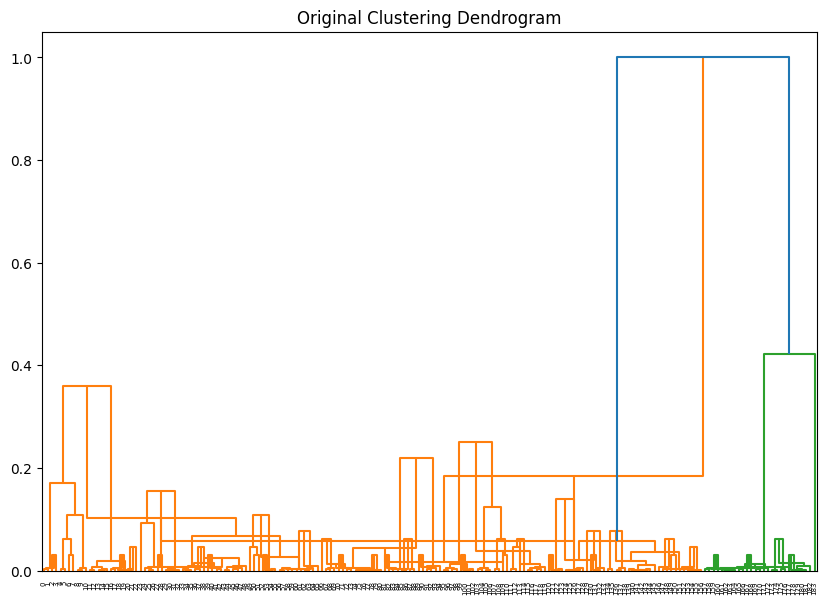

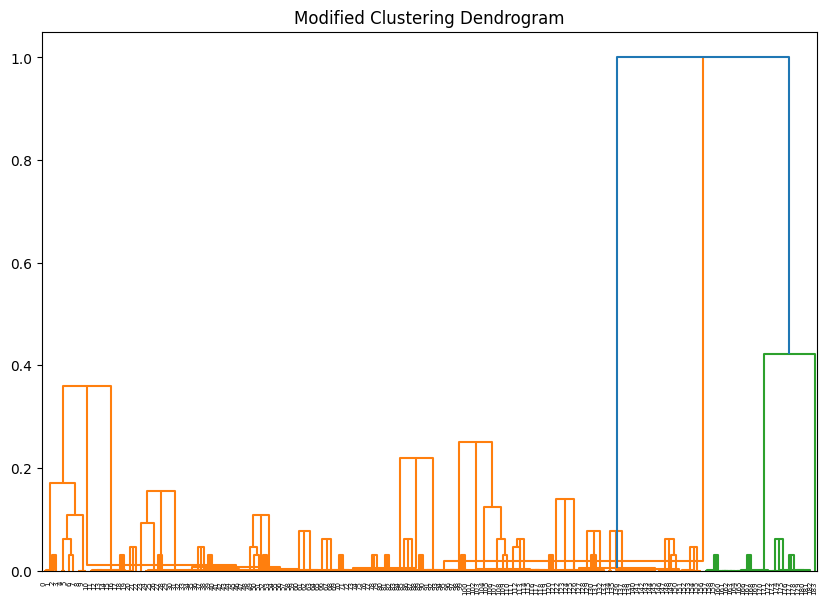

In [59]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(clustering, title='Clustering Dendrogram'):
    plt.figure(figsize=(10, 7))
    plt.title(title)
    dendrogram(clustering)
    plt.show()

# Original clustering
original_clustering = masker.clustering(sample_sentence)
plot_dendrogram(original_clustering, title='Original Clustering Dendrogram')

# Modified clustering
modified_clustering = masker._modify_clustering(original_clustering)
plot_dendrogram(modified_clustering, title='Modified Clustering Dendrogram')


In [54]:
shap_values.values[0].shape

(184, 17)

In [55]:
shap.plots.text(shap_values[0, :, :], xmin=-1, xmax=1)